In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import scipy
from brian2.units import *
%matplotlib inline
plt.viridis()

In [2]:
from matplotlib import animation, rc
from IPython.display import HTML

In [3]:
no_iterations = 3000000

# Wiring
n = 16
N = n ** 2
S = np.asarray((n, n))

s_max = 32
sigma_form_forward = 2.5
sigma_form_lateral = 1
p_form_lateral = 1
p_form_forward = 0.16
p_elim_dep = 0.0245
p_elim_pot = 1.36 * np.e ** -4
f_rew = 10 ** 4 * Hz#Hz

# Membrane
v_rest = -70 * mvolt #mV
e_ext = 0 * mvolt #V
v_thr = -54 * mvolt #mV
g_max = 0.2
tau_m = 20* ms #ms
tau_ex = 5* ms #ms
e = np.e
g = g_max
pre_t = 0 * ms


# Inputs
f_mean = 20 * Hz
f_base = 5 * Hz
f_peak = 152.8  * Hz
sigma_stim = 2
t_stim = 0.02 * second
rate = 200 * Hz

# STDP
Apre = a_plus = 0.1
b = 1.2
taupre = tau_plus = 20 * ms #ms
taupost = tau_minus = 64 * ms #ms
Apost = a_minus = (a_plus * tau_plus * b) / tau_minus


In [4]:
def poisson_generator(rate, t_start, t_stop):
    n = int((t_stop - t_start) / 1000.0 * rate)
    number = np.ceil(n + 3 * np.sqrt(n))
    if number < 100:
        number = min(5 + np.ceil(2 * n), 100)

    if number > 0:
        isi = np.random.exponential(1.0 / rate, int(number)) * 1000.0
        if number > 1:
            spikes = np.add.accumulate(isi)
        else:
            spikes = isi
    else:
        spikes = np.array([])

    spikes += t_start
    i = np.searchsorted(spikes, t_stop)

    extra_spikes = []
    if len(spikes) == i:
        # ISI buf overrun

        t_last = spikes[-1] + np.random.exponential(1.0 / rate, 1)[0] * 1000.0

        while (t_last < t_stop):
            extra_spikes.append(t_last)
            t_last += np.random.exponential(1.0 / rate, 1)[0] * 1000.0

            spikes = np.concatenate((spikes, extra_spikes))
    else:
        spikes = np.resize(spikes, (i,))

    # Return spike times, rounded to millisecond boundaries
    return [round(x) for x in spikes]

In [5]:
def distance(x0, x1, grid, type='euclidian'):
    x0 = np.asarray(x0)
    x1 = np.asarray(x1)
    delta = np.abs(x0 - x1)
    delta = np.where(delta > grid * .5, delta - grid, delta)
    
    if type=='manhattan':
        return np.abs(delta).sum(axis=-1)
    return np.sqrt((delta ** 2).sum(axis=-1))

In [6]:
def generate_rates(s, grid):
        '''
        Function that generates an array the same shape as the input layer so that
        each cell has a value corresponding to the firing rate for the neuron
        at that position.
        '''
        _rates = np.zeros(grid)
        for x in range(grid[0]):
            for y in range(grid[1]):
                _d = distance(s, (x, y), grid)
                _rates[x, y] = f_base + f_peak * np.e ** (-_d / ((2 * sigma_stim) ** 2))
        return _rates * Hz

In [7]:
def generate_spikes(rates):
    spikes = np.zeros((16,16,21))
    for x in range(16):
        for y in range(16):
            spikes_times_xy = poisson_generator(rates[x,y], 0 , 20)
            for time in spikes_times_xy:
                spikes[x,y,int(time)] = 1
    return spikes

In [8]:
grid = np.asarray((16, 16))
s = (5, 15)

In [9]:
input_rates = generate_rates(s, grid)

In [10]:
input_rates.shape

(16, 16)

In [11]:
poisson_generator(100, 0 , 20)

[5.0, 11.0]

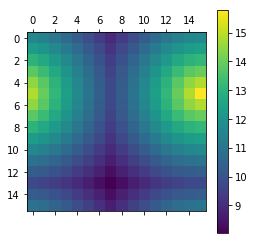

In [70]:
plt.matshow(input_rates/Hz/10., fignum=160)
plt.grid(visible=False)
plt.colorbar()

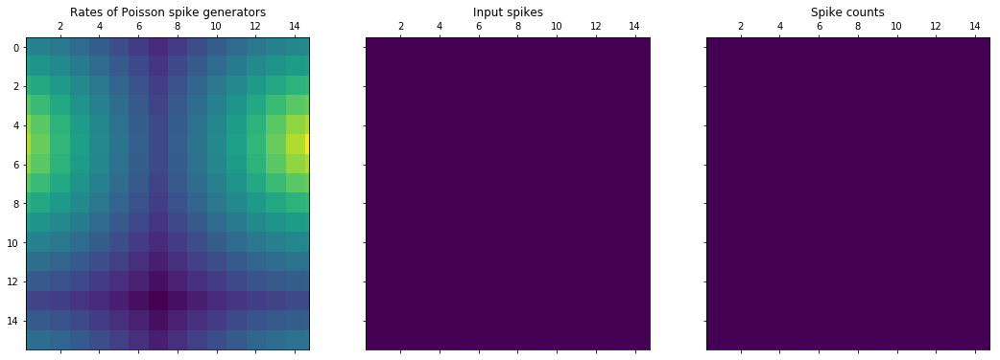

In [105]:
# First set up the figure, the axis, and the plot element we want to animate
fig, (ax1, ax2, ax3) = plt.subplots(1, 3,figsize=(18,6), sharey=True)
# ax.set_xlim(( 0, 16))
# ax.set_ylim(( 0, 16))
rates = generate_rates(np.random.randint(0, 16, size=2), grid)/10.
spikes_in_window = generate_spikes(rates/Hz)
    
image = np.zeros((16,16))
rates = np.zeros((16,16))
rate_ax = ax1.matshow(input_rates/Hz)
spikes_ax = ax2.matshow(np.zeros((16,16)), vmin=0, vmax=140)
count_ax = ax3.matshow(np.zeros((16,16)), vmin =0, vmax=200)

ax1.set_title("Rates of Poisson spike generators")
ax2.set_title("Input spikes")
ax3.set_title("Spike counts")
spikes_in_window = generate_spikes(input_rates/Hz)


rates = generate_rates((8,8), grid)
count = np.zeros((16,16))

In [106]:

# initialization function: plot the background of each frame
def init():
#     line.set_data(input_rates/Hz)
    rate_ax.set_data(np.zeros((16,16)))
    spikes_ax.set_data(np.zeros((16,16)))
    count_ax.set_data(np.zeros((16,16)))
    count = np.zeros((16,16))
    return (rate_ax, spikes_ax, count_ax)

In [107]:
# animation function. This is called sequentially
def animate(i):
    global image, grid, spikes_in_window, rates, count
    if i % 20 == 0:
        spikes_in_window = generate_spikes(rates/Hz/10.)

    
    image += spikes_in_window[0:16, 0:16, i%20] * 100
    count += spikes_in_window[0:16, 0:16, i%20]
            
    rate_ax.set_data(rates)
    spikes_ax.set_data(image)
    count_ax.set_data(count)
    image *= .8
    return (rate_ax,spikes_ax,)

In [108]:
# call the animator. blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=10000, interval=60, blit=True)

In [109]:
HTML(anim.to_html5_video())

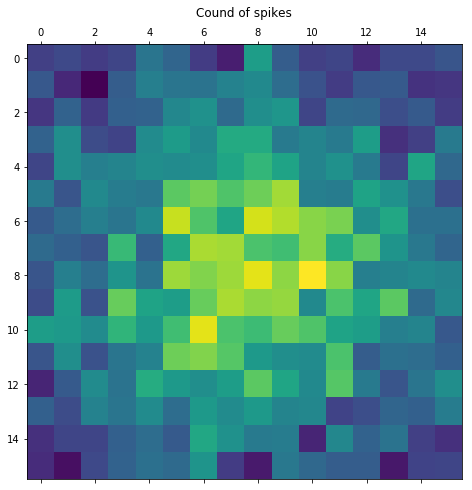

In [86]:
fig3, ax3 = plt.subplots(1,1,figsize=(8,8))
ax3.matshow(count)
ax3.set_title("Count of spikes")
# plt.grid(visible=False)
# plt.colorbar()

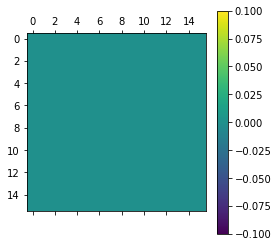

In [88]:
plt.matshow(count)
plt.grid(visible=False)
plt.colorbar()

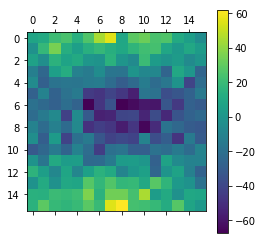

In [78]:
expected_counts = (generate_rates(np.random.randint(0, 16, size=2), grid)/Hz/10.)*10
plt.figure(figsize=(16,16))
plt.matshow(expected_counts-count, fignum=180)
plt.grid(visible=False)
plt.colorbar()

In [89]:
np.max(expected_counts)

157.80000000000001

In [342]:
Writer = animation.writers['ffmpeg']
writer = Writer(fps=60, metadata=dict(artist='Petrut A Bogdan'), bitrate=1800)

In [343]:
anim.save('stationary_input_with_rates.mp4', writer=writer)

In [50]:
spikes_in_window[0,0,:]

array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.])

In [356]:
x = np.arange(90).reshape(3,3,10)

In [357]:
x.reshape(9, 10)

array([[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9],
       [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
       [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
       [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
       [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
       [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
       [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
       [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
       [80, 81, 82, 83, 84, 85, 86, 87, 88, 89]])

In [358]:
[[],]*10

[[], [], [], [], [], [], [], [], [], []]

In [359]:
rates = np.zeros((16, 16, 5000 // 20))
for rate_id in range(5000 // 20):
    rates[:, :, rate_id] = generate_rates(np.random.randint(0, n, size=2), grid)

In [361]:
rates.shape

(16, 16, 250)

In [380]:
simtime=5000
t_stim=20
N_layer=16**2
rates = np.zeros((16, 16, simtime // t_stim))
for rate_id in range(simtime // t_stim):
    rates[:, :, rate_id] = generate_rates(np.random.randint(0, n, size=2), grid)
rates = rates.reshape(N_layer, simtime // t_stim)
spike_times = [[], ] * N_layer

for n_id in range(N_layer):
    for time in range(rates.shape[1]):
        spike_times[n_id] += poisson_generator(rates[n_id, time], time * t_stim, time * (t_stim + 1) - 1)

spikeArray = {'spike_times': spike_times}

In [381]:
spike_times[0]

[83.0,
 123.0,
 160.0,
 183.0,
 223.0,
 245.0,
 289.0,
 309.0,
 311.0,
 330.0,
 334.0,
 343.0,
 352.0,
 354.0,
 361.0,
 371.0,
 383.0,
 391.0,
 393.0,
 408.0,
 427.0,
 444.0,
 444.0,
 453.0,
 468.0,
 469.0,
 471.0,
 481.0,
 484.0,
 497.0,
 497.0,
 525.0,
 536.0,
 541.0,
 547.0,
 553.0,
 556.0,
 563.0,
 577.0,
 580.0,
 585.0,
 595.0,
 600.0,
 605.0,
 612.0,
 613.0,
 622.0,
 622.0,
 625.0,
 629.0,
 632.0,
 633.0,
 635.0,
 638.0,
 643.0,
 649.0,
 650.0,
 653.0,
 655.0,
 658.0,
 669.0,
 671.0,
 661.0,
 673.0,
 673.0,
 691.0,
 681.0,
 683.0,
 686.0,
 687.0,
 690.0,
 698.0,
 698.0,
 701.0,
 712.0,
 712.0,
 722.0,
 725.0,
 734.0,
 744.0,
 742.0,
 747.0,
 767.0,
 772.0,
 760.0,
 786.0,
 790.0,
 784.0,
 796.0,
 798.0,
 799.0,
 800.0,
 816.0,
 816.0,
 818.0,
 825.0,
 832.0,
 826.0,
 829.0,
 834.0,
 837.0,
 849.0,
 852.0,
 859.0,
 850.0,
 855.0,
 869.0,
 862.0,
 865.0,
 866.0,
 876.0,
 879.0,
 880.0,
 889.0,
 894.0,
 896.0,
 898.0,
 899.0,
 900.0,
 901.0,
 909.0,
 914.0,
 918.0,
 921.0,
 942.0,
 

In [379]:
[] + [0, 1, 3] + [2]

[0, 1, 3, 2]